<h1 align="center">Visual Behavior Neuropixels SWDB 2022 </h1>
<h3 align="center">Entrypoint</h3>

# SET UP - Pick Session

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec #Useful tool to arrange multiple plots in one figure (https://matplotlib.org/stable/api/_as_gen/matplotlib.gridspec.GridSpec.html)
from matplotlib.patches import Patch
from matplotlib.patches import Rectangle

from util import set_up_cache, get_session, plot_unit_spikes, plot_one_trial, plot_trials, plot_trials_chron, plot_trials_timeline, horizontal_bar_plot_trials, trials_data_description
from util_eda import get_missing_durations, create_unit_activity_vectors, plot_stimulus_presentations_with_activities, get_unit_activity_vectors_for_image, average_population_response_over_same_stimulus_presentations, count_same_image_appearences, extract_speed_and_pupil_data, plot_active_vs_passive_RS_running_speed_and_pupil_area_over_time, running_speeds_and_pupil_areas, count_all_same_image_appearences, construct_unit_activity_population_response_matrix
from util_RS_plots import specific_image, plot_layered_RS_running_speed_and_pupil_area_all_images, RS_vs_speed_active_passive, RS_vs_time_avg_active_passive, correlation_between_picture_pair


%matplotlib inline

%load_ext autoreload
%autoreload 2
%aimport util

import util

/Users/kiracordes/opt/anaconda3/lib/python3.7/site-packages/requests/__init__.py:104: RequestsDependencyWarning: urllib3 (1.26.9) or chardet (5.0.0)/charset_normalizer (2.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


In [2]:
cache = set_up_cache()

In [3]:
ecephys_sessions_table = cache.get_ecephys_session_table()
ecephys_sessions_table.head()

,behavior_session_id,date_of_acquisition,equipment_name,session_type,mouse_id,genotype,sex,project_code,age_in_days,unit_count,...,channel_count,structure_acronyms,image_set,prior_exposures_to_image_set,session_number,experience_level,prior_exposures_to_omissions,file_id,abnormal_histology,abnormal_activity
ecephys_session_id,,,,,,,,,,,,,,,,,,,,,
1044385384,1044408432,2020-08-19 14:47:08.574000+00:00,NP.1,EPHYS_1_images_G_5uL_reward,524761,wt/wt,F,NeuropixelVisualBehavior,151,2179.0,...,1920.0,"['CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg', 'LGv...",G,30.0,1,Familiar,0,870,NaN,NaN
1044594870,1044624428,2020-08-20 15:03:56.422000+00:00,NP.1,EPHYS_1_images_H_5uL_reward,524761,wt/wt,F,NeuropixelVisualBehavior,152,2103.0,...,1920.0,"['CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg', 'HPF...",H,0.0,2,Novel,1,872,NaN,NaN
1047969464,1048005547,2020-09-02 14:53:14.347000+00:00,NP.1,EPHYS_1_images_G_3uL_reward,509808,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,M,NeuropixelVisualBehavior,263,2438.0,...,2304.0,"['APN', 'CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg...",G,62.0,1,Familiar,0,877,NaN,NaN
1047977240,1048009327,2020-09-02 15:15:03.733000+00:00,NP.0,EPHYS_1_images_G_3uL_reward,524925,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,F,NeuropixelVisualBehavior,165,1856.0,...,2304.0,"['APN', 'CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg...",G,51.0,1,Familiar,0,878,NaN,NaN
1048189115,1048221709,2020-09-03 14:16:57.913000+00:00,NP.1,EPHYS_1_images_H_3uL_reward,509808,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,M,NeuropixelVisualBehavior,264,1925.0,...,2304.0,"['APN', 'CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg...",H,0.0,2,Novel,1,879,NaN,NaN


In [4]:
ecephys_sessions_table[ecephys_sessions_table['mouse_id']==527749]

,behavior_session_id,date_of_acquisition,equipment_name,session_type,mouse_id,genotype,sex,project_code,age_in_days,unit_count,...,channel_count,structure_acronyms,image_set,prior_exposures_to_image_set,session_number,experience_level,prior_exposures_to_omissions,file_id,abnormal_histology,abnormal_activity
ecephys_session_id,,,,,,,,,,,,,,,,,,,,,
1053718935,1053759573,2020-09-30 14:27:36.212000+00:00,NP.1,EPHYS_1_images_G_3uL_reward,527749,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,M,NeuropixelVisualBehavior,179,2508.0,...,2304.0,"['APN', 'CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg...",G,46.0,1,Familiar,0,889,NaN,NaN
1053941483,1053960987,2020-10-01 17:03:58.362000+00:00,NP.1,EPHYS_1_images_H_3uL_reward,527749,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,M,NeuropixelVisualBehavior,180,1543.0,...,2304.0,"['APN', 'CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg...",H,0.0,2,Novel,1,891,NaN,NaN


In [5]:
session = get_session(session_id=1053941483)  

In [6]:
session.metadata

{'equipment_name': 'NP.1',
 'sex': 'M',
 'age_in_days': 180,
 'stimulus_frame_rate': 60.0,
 'session_type': 'EPHYS_1_images_H_3uL_reward',
 'date_of_acquisition': datetime.datetime(2020, 10, 2, 0, 3, 58, tzinfo=tzutc()),
 'reporter_line': 'Ai32(RCL-ChR2(H134R)_EYFP)',
 'cre_line': 'Sst-IRES-Cre',
 'behavior_session_uuid': None,
 'driver_line': ['Sst-IRES-Cre'],
 'mouse_id': 527749,
 'full_genotype': 'Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt',
 'behavior_session_id': 1053960987,
 'ecephys_session_id': 1053941483}

In [7]:
stimulus_presentations = session.stimulus_presentations
# This table is a record of every stimulus we presented to the mouse over the course of this experiment
print(len(stimulus_presentations))
# stimulus_presentations.tail()
stimulus_presentations.head()

13405


,active,color,contrast,duration,end_frame,flashes_since_change,image_name,is_change,is_image_novel,omitted,...,position_y,rewarded,spatial_frequency,start_frame,start_time,stimulus_block,stimulus_index,stimulus_name,stop_time,temporal_frequency
stimulus_presentations_id,,,,,,,,,,,,,,,,,,,,,
0,True,NaN,NaN,0.250212,75,0.0,im104_r,0.0,1.0,0.0,...,NaN,0.0,NaN,60,25.254420,0,NaN,Natural_Images_Lum_Matched_set_ophys_H_2019,25.504632,NaN
1,True,NaN,NaN,0.250212,120,1.0,im104_r,0.0,1.0,0.0,...,NaN,0.0,NaN,105,26.005057,0,NaN,Natural_Images_Lum_Matched_set_ophys_H_2019,26.255269,NaN
2,True,NaN,NaN,0.250208,165,2.0,im104_r,0.0,1.0,0.0,...,NaN,0.0,NaN,150,26.755685,0,NaN,Natural_Images_Lum_Matched_set_ophys_H_2019,27.005892,NaN
3,True,NaN,NaN,0.250207,210,3.0,im104_r,0.0,1.0,0.0,...,NaN,0.0,NaN,195,27.506307,0,NaN,Natural_Images_Lum_Matched_set_ophys_H_2019,27.756515,NaN
4,True,NaN,NaN,0.250213,255,4.0,im104_r,0.0,1.0,0.0,...,NaN,0.0,NaN,240,28.256929,0,NaN,Natural_Images_Lum_Matched_set_ophys_H_2019,28.507142,NaN


In [8]:
units = session.get_units()
# This table contains quality metrics and waveform metrics for every unit recorded during this session
units.head()

channels = session.get_channels()
# This table contains info about where each channel was in the brain as well as it's relative position along the probe.
channels.head(3)

# merge
units = units.merge(channels, left_on='peak_channel_id', right_index=True)
#units.head()

# how many units were recorded in each brain area for this session?
# units.value_counts('structure_acronym')

In [9]:
trials = session.trials
change_trials = trials[trials.is_change]
spike_times = session.spike_times
running_speed = session.running_speed
eye_tracking = session.eye_tracking

# Pick Units: 


<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

Now that we have our change times, we're almost ready to make our PSTH. Next we need to get spike times for a good unit. To start out, let's filter our units dataframe for 'good' units, based on the following criteria:
    <p> &emsp; a) <code>quality</code> == 'good'
            <p> &emsp; b) <code>firing_rate</code> > 1 Hz
            <p> &emsp; c) <code>snr</code> > 1
            <p> &emsp; d) <code>isi_violations</code> < 1
                                                         
Then we'll grab an example unit from this curated list
</div>

In [10]:
# Filter units by the quality criteria
good_units = units[(units['quality']=='good') &
                   (units['firing_rate']>1) &
                   (units['snr']>1) &
                   (units['isi_violations']<1)]

len(good_units)

987

In [11]:
good_units.head(1)

,PT_ratio,amplitude,amplitude_cutoff,cluster_id,cumulative_drift,d_prime,firing_rate,isi_violations,isolation_distance,l_ratio,...,waveform_duration,anterior_posterior_ccf_coordinate,dorsal_ventral_ccf_coordinate,filtering,left_right_ccf_coordinate,probe_channel_number,probe_horizontal_position,probe_id,probe_vertical_position,structure_acronym
id,,,,,,,,,,,,,,,,,,,,,
1061853767,0.738222,632.394165,0.000008,23,79.63,10.843623,68.687706,0.000167,246.203332,3.104812e-08,...,0.20603,8254.0,3707.0,AP band: 500 Hz high-pass; LFP band: 1000 Hz l...,6982.0,30,59,1054059289,320,APN


In [12]:
good_VISp_units = good_units[good_units['structure_acronym']=='VISp']
good_CA1_units = good_units[good_units['structure_acronym']=='CA1']
good_VIS_units = good_units[good_units['structure_acronym'].str.contains('VIS')]
len(good_CA1_units), len(good_VISp_units), len(good_VIS_units)

(175, 43, 310)

# Construct Unit Activity Matrix 
 
 from picked units and spikes in each stimulus presentation

In [13]:
stimulus_presentations
(len(stimulus_presentations),len(stimulus_presentations[stimulus_presentations.stimulus_block == 0]))

(13405, 4804)

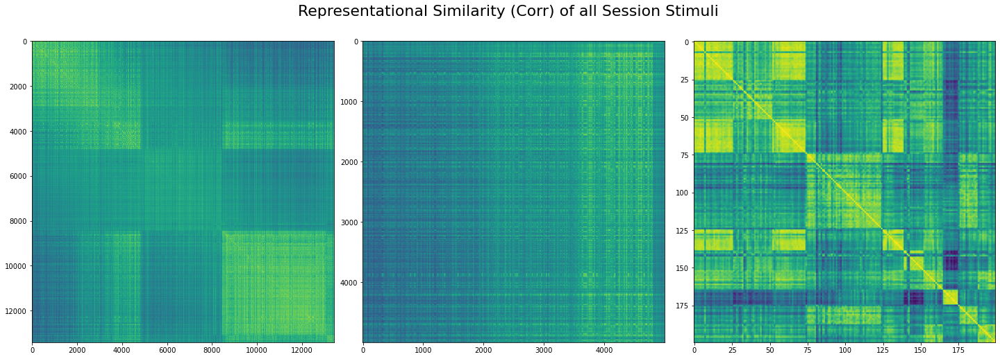

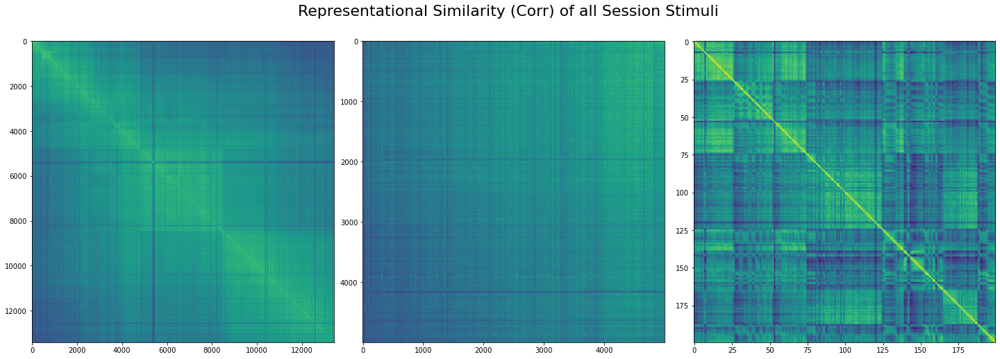

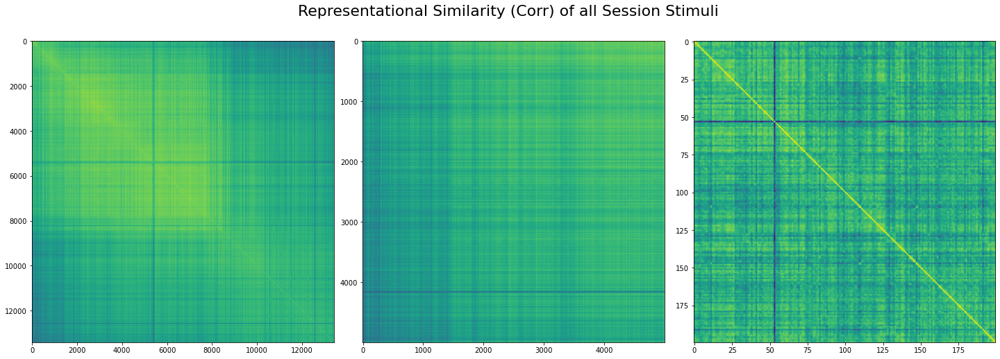

In [14]:
M_good_VISp = construct_unit_activity_population_response_matrix(good_VISp_units, spike_times, stimulus_presentations)
M_all_good = construct_unit_activity_population_response_matrix(good_units, spike_times, stimulus_presentations)
M_good_CA1 = construct_unit_activity_population_response_matrix(good_CA1_units, spike_times, stimulus_presentations)


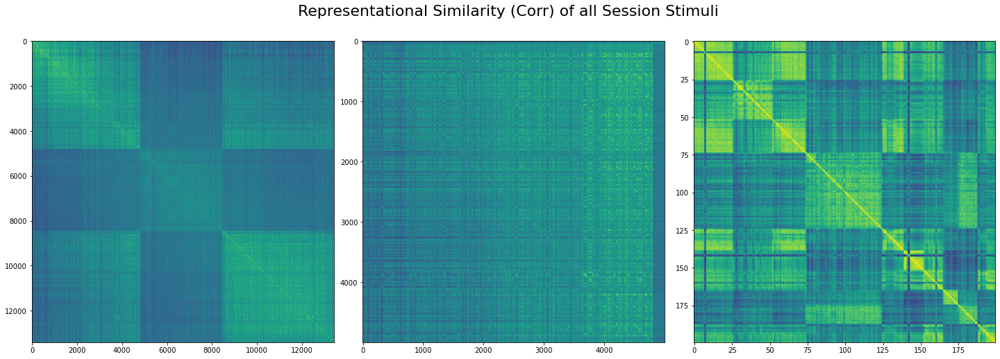

In [15]:
M_good_VIS = construct_unit_activity_population_response_matrix(good_VIS_units, spike_times, stimulus_presentations)

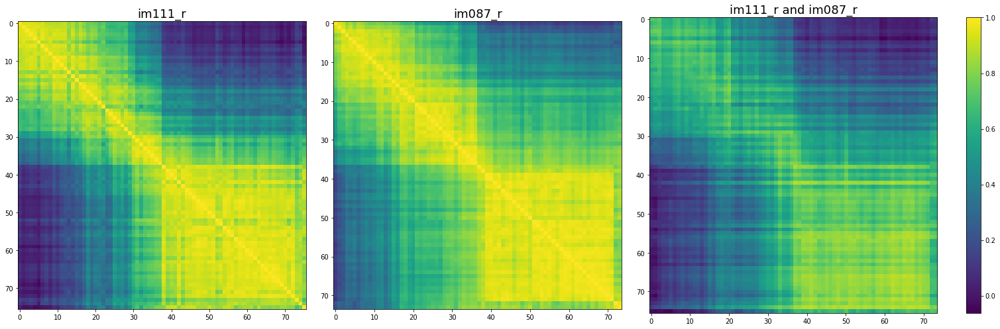

In [16]:
correlation_between_picture_pair('im111_r', 'im087_r', M_good_VISp, stimulus_presentations)

# Get Unit Activites for Fixed Images (averaged)

In [17]:
valid_images = []
for im in stimulus_presentations.image_name.unique():
    if (im != 'omitted') and (type(im) is not float):
        valid_images.append(im)
        
print(valid_images)


['im104_r', 'im087_r', 'im111_r', 'im005_r', 'im034_r', 'im083_r', 'im024_r', 'im114_r']


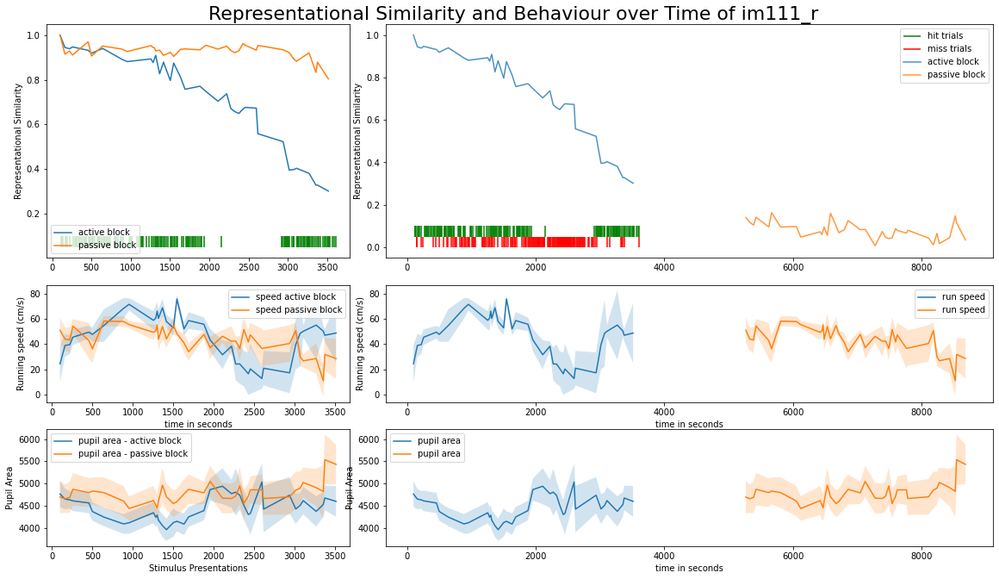

In [18]:
specific_image('im111_r', M_good_VISp, stimulus_presentations, running_speed, eye_tracking, change_trials)

In [21]:
colors = ['blue', 'orange', 'purple', 'firebrick', 'cornflowerblue', 'darkblue', 'magenta', 'green', 'thistle']

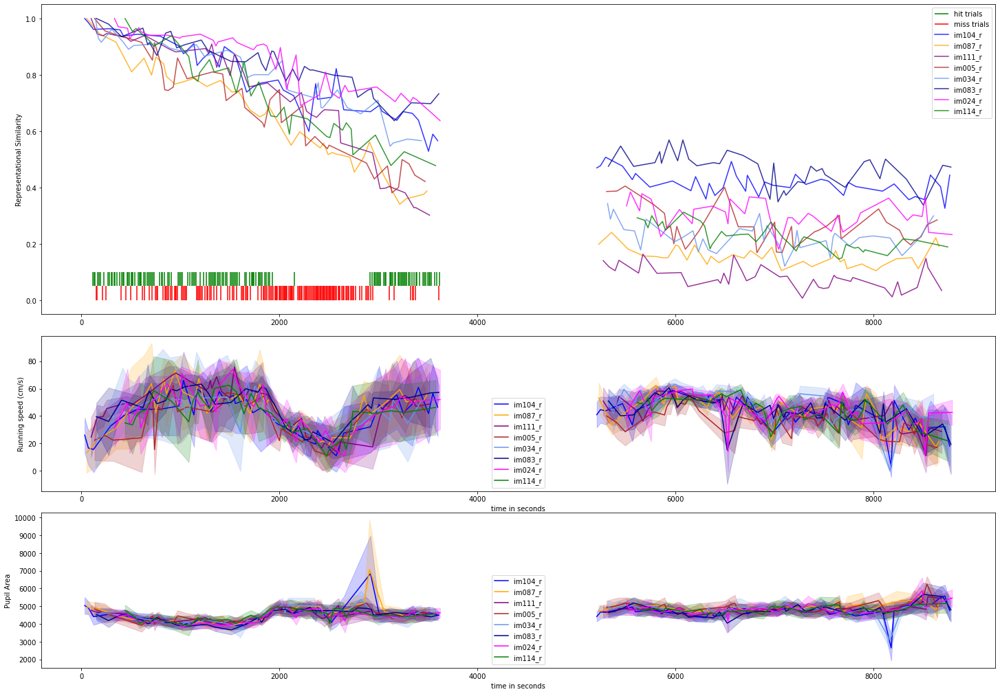

In [22]:
# print all images layered for M
plot_layered_RS_running_speed_and_pupil_area_all_images(valid_images, M_good_VISp, stimulus_presentations, running_speed, eye_tracking, colors, change_trials)


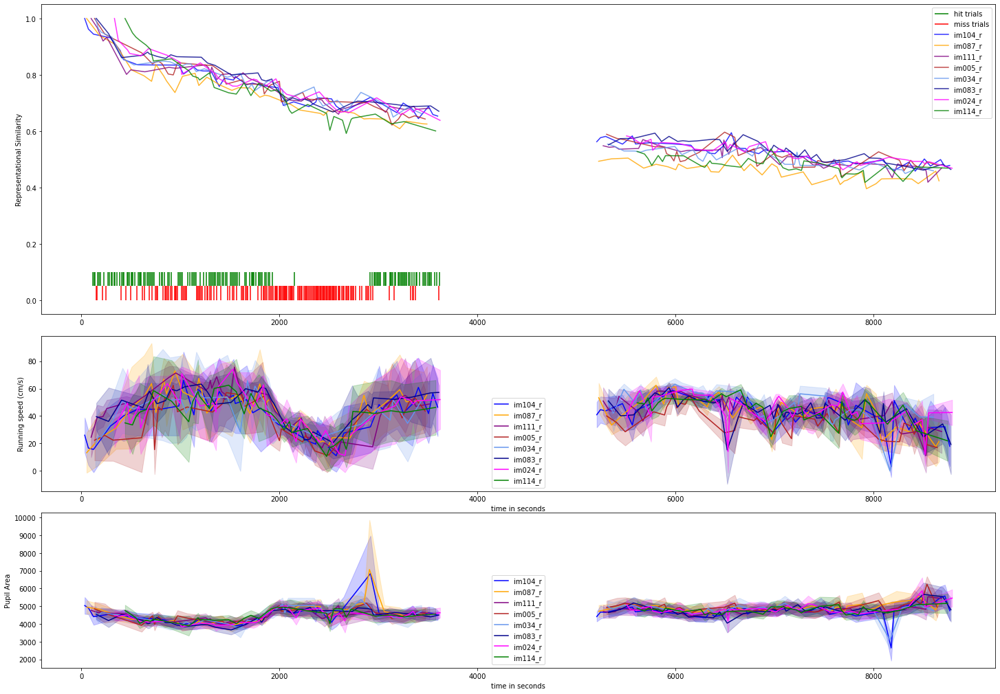

In [23]:
# print all images layered for M_all_good
plot_layered_RS_running_speed_and_pupil_area_all_images(valid_images, M_all_good, stimulus_presentations, running_speed, eye_tracking, colors, change_trials)



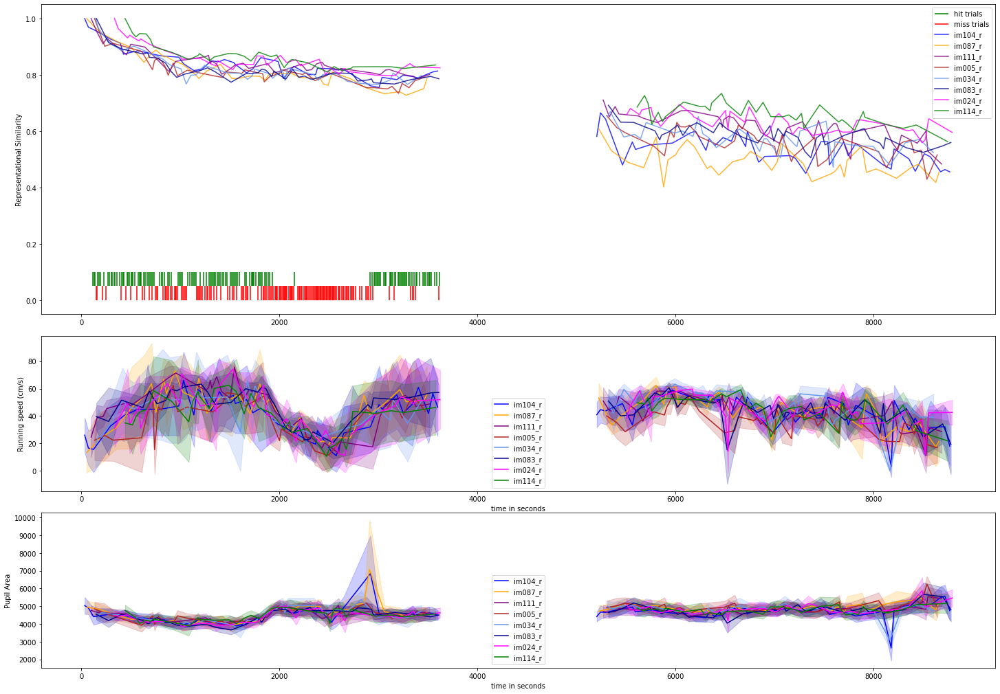

In [24]:
plot_layered_RS_running_speed_and_pupil_area_all_images(valid_images, M_good_CA1, stimulus_presentations, running_speed, eye_tracking, colors, change_trials)


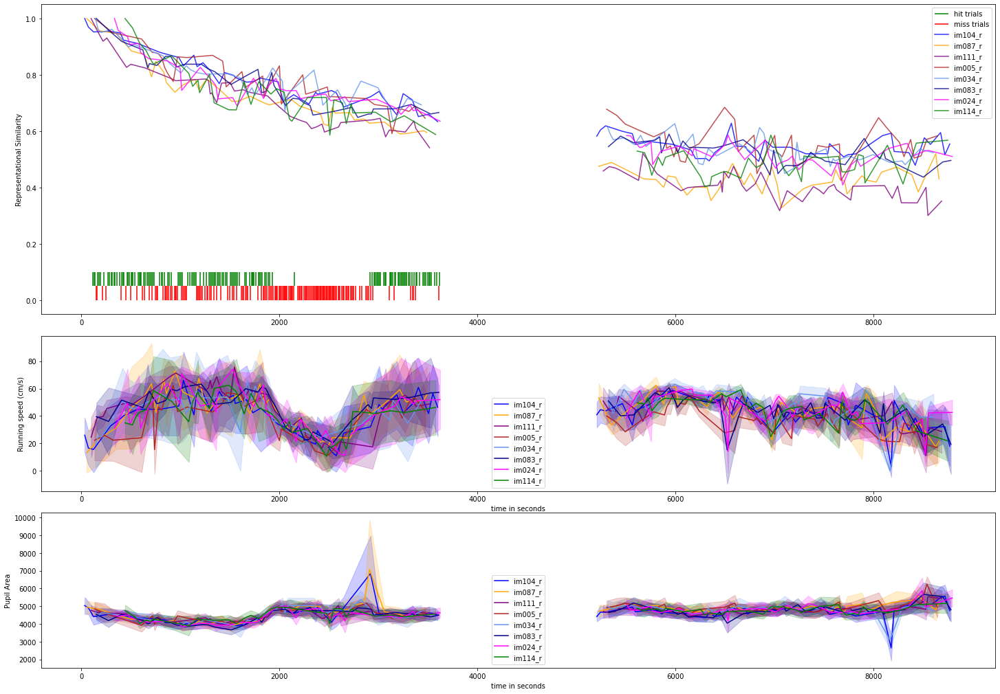

In [25]:
plot_layered_RS_running_speed_and_pupil_area_all_images(valid_images, M_good_VIS, stimulus_presentations, running_speed, eye_tracking, colors, change_trials)


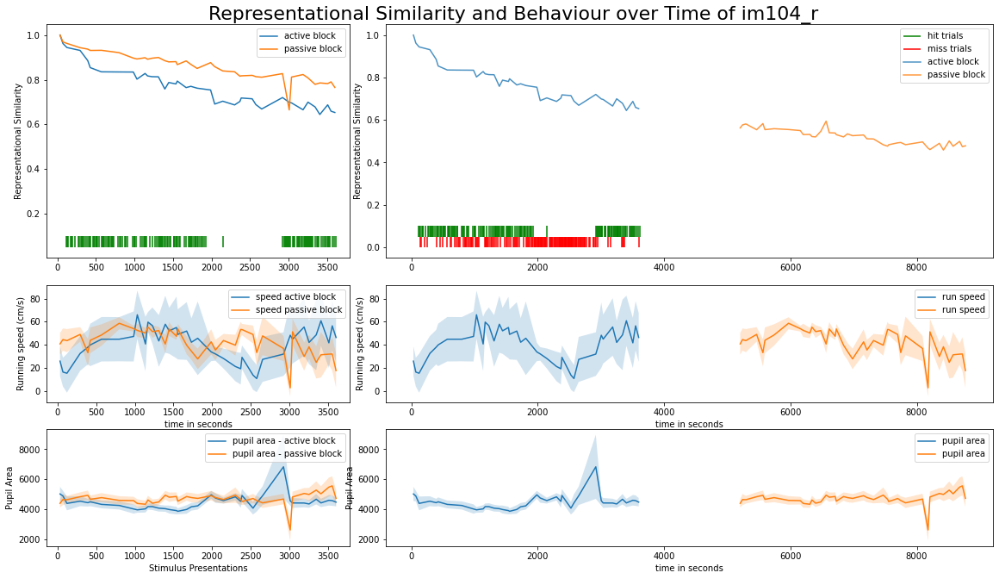

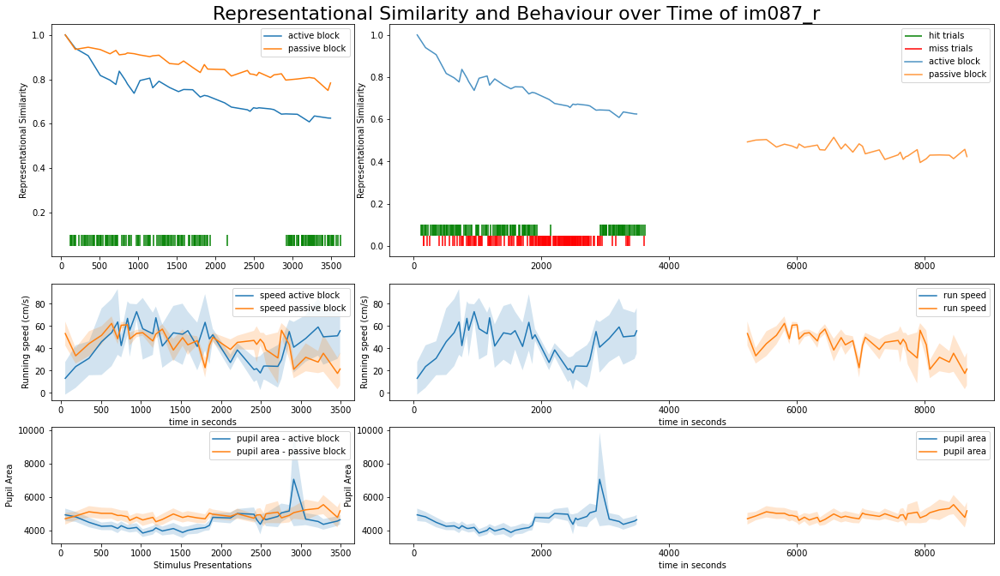

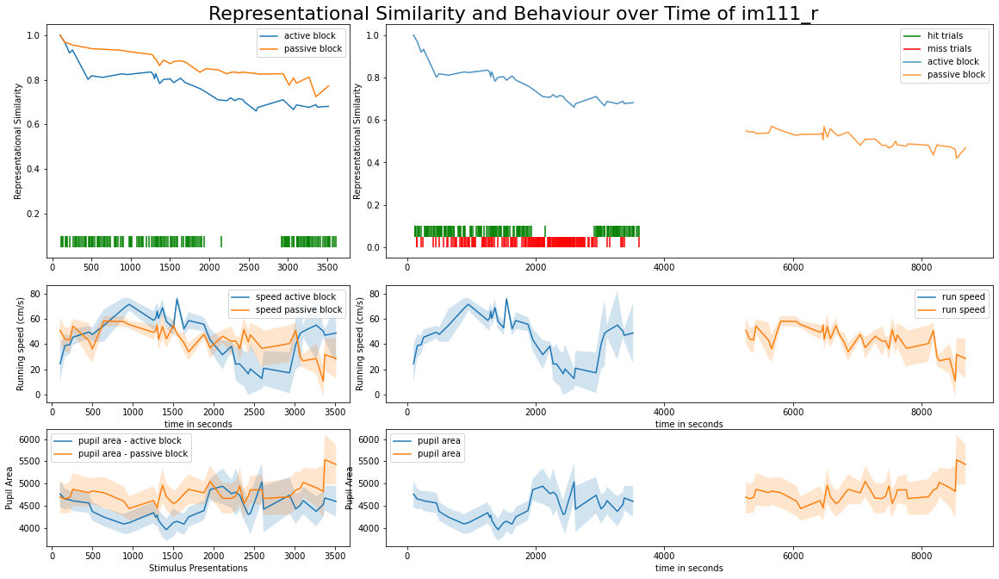

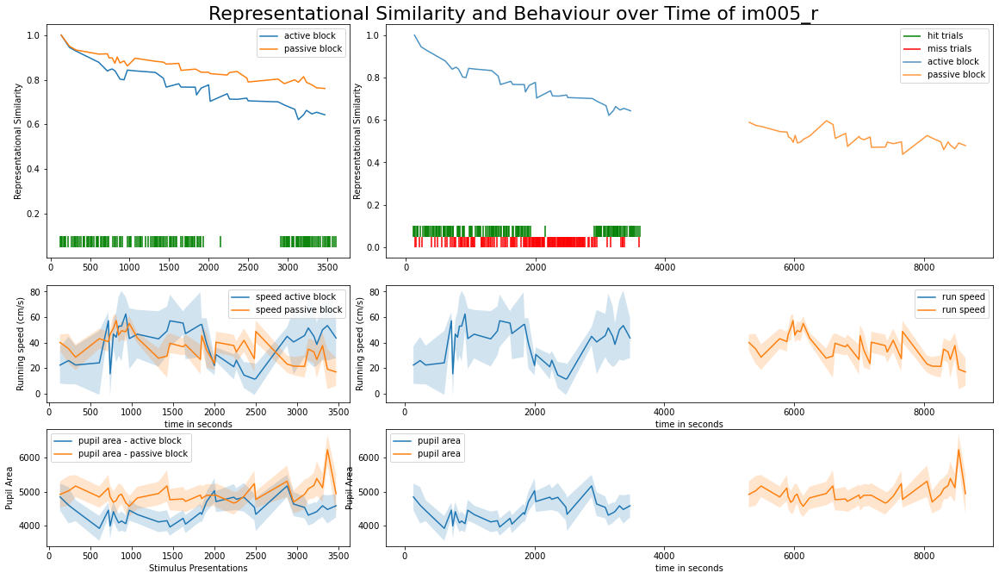

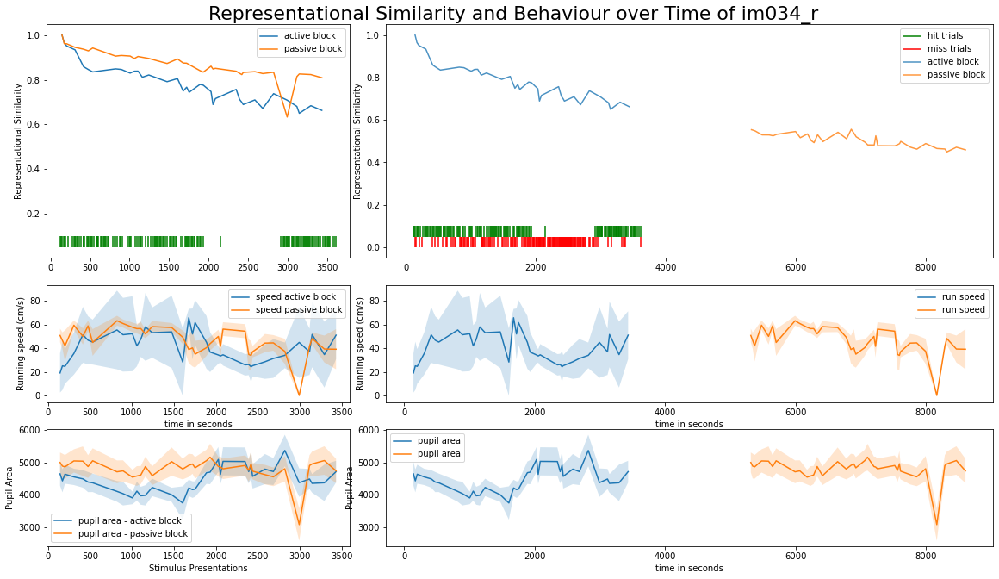

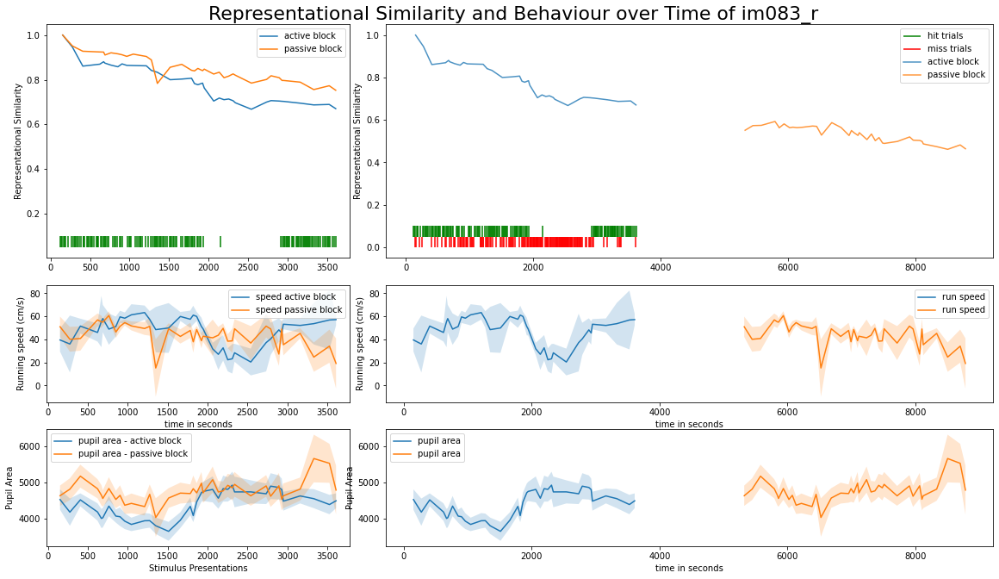

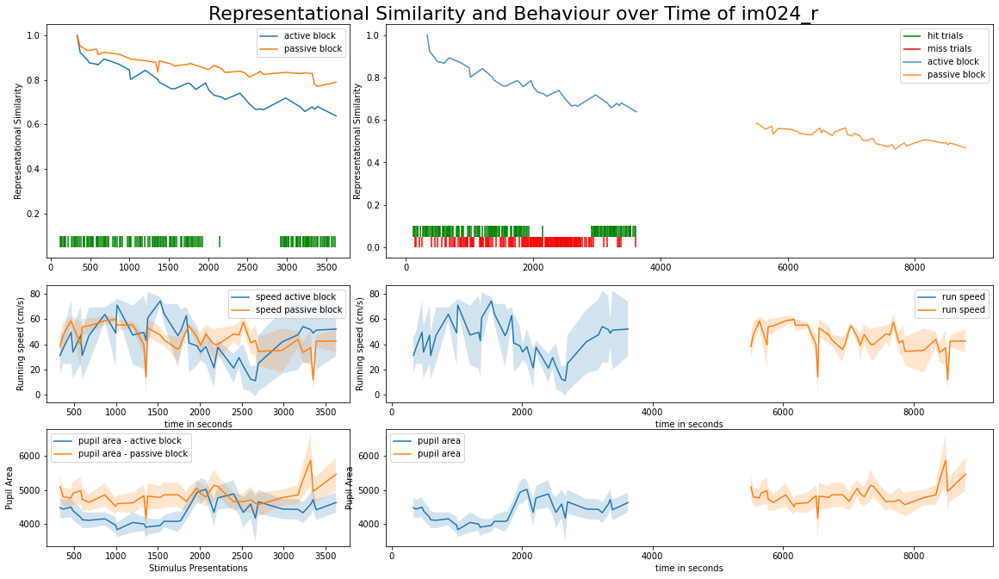

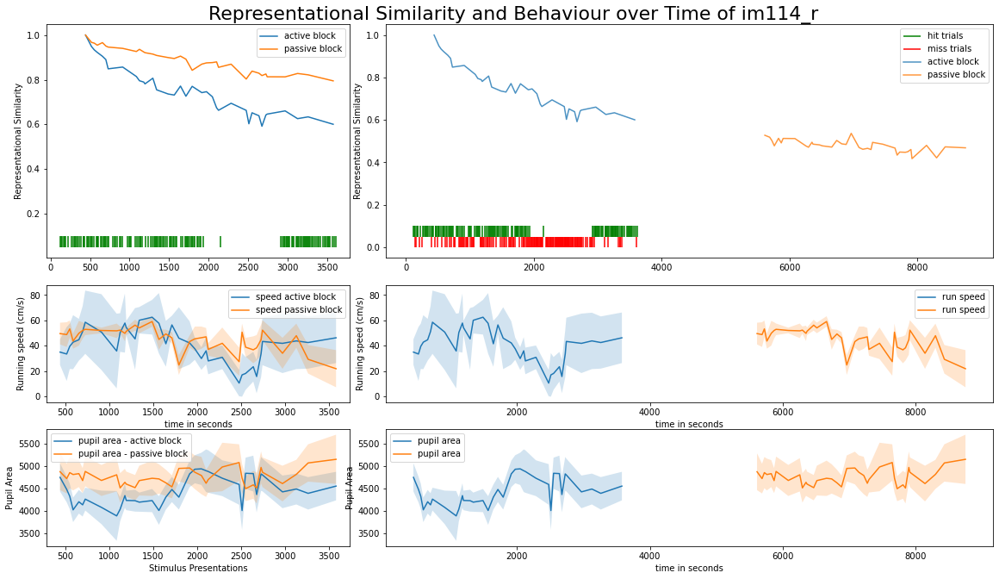

In [26]:
# print all images full information

for image in valid_images:
    specific_image(image, M_all_good, stimulus_presentations, running_speed, eye_tracking, change_trials)
    
    

#  2. Add CHAINS column to stimulus_presentations table

In [27]:
im_chains = count_all_same_image_appearences(stimulus_presentations)
stimulus_presentations['image_chain'] = im_chains
im111_sp = stimulus_presentations[stimulus_presentations['image_name']=='im111_r']
len(im111_sp[im111_sp['image_chain']==3.0])


22

#  3. Representational Similarity vs. delta V (behaviour)

In [28]:
from itertools import combinations, product

for pair in combinations(range(6), 2):
    i, j = pair
    print(i,j)
    
    
print('product: ')
a = range(3)
b = range(3, 6)
for pair in product(a,b):
    i, j = pair
    print(i,j)
    

0 1
0 2
0 3
0 4
0 5
1 2
1 3
1 4
1 5
2 3
2 4
2 5
3 4
3 5
4 5
product: 
0 3
0 4
0 5
1 3
1 4
1 5
2 3
2 4
2 5


In [29]:
# TODO: Regression and differentiation between active and passive block

plotting every 10-th datapoint
13861 13861


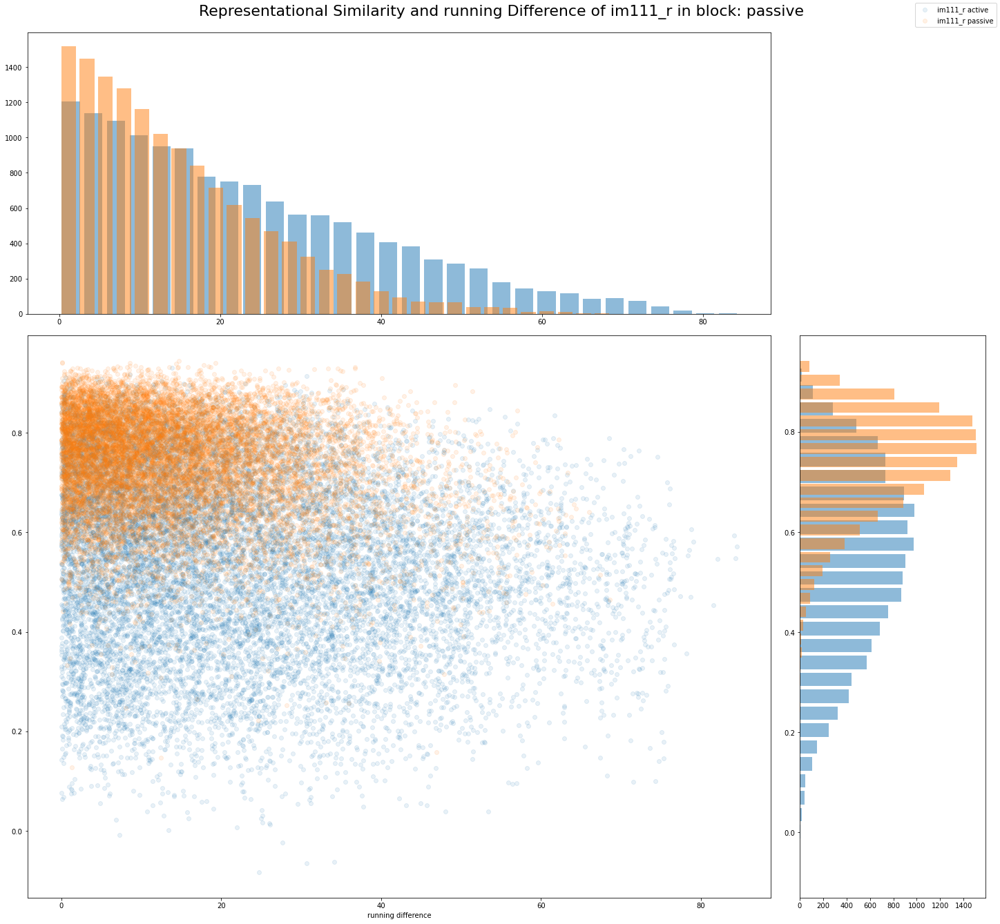

In [30]:
RS_vs_speed_active_passive('im111_r', M_good_VISp, stimulus_presentations, running_speed, eye_tracking,'running', 'passive')

In [31]:
RS_vs_speed_avg_active_passive('im111_r', M_good_VISp, stimulus_presentations, running_speed, eye_tracking, 'pupil')
RS_vs_speed_avg_active_passive('im111_r', M_good_VISp, stimulus_presentations, running_speed, eye_tracking, 'running')

NameError: name 'RS_vs_speed_avg_active_passive' is not defined

#  4. Representational Similarity vs. Time Difference

im111_r


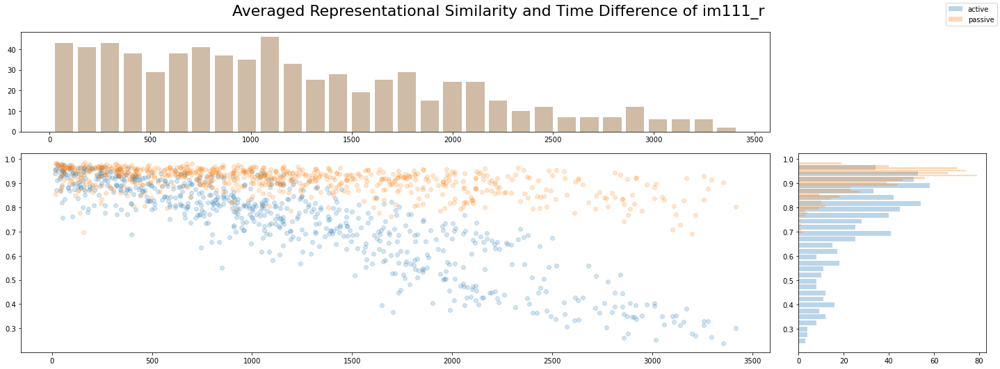

In [32]:
RS_vs_time_avg_active_passive('im111_r', M_good_VISp, stimulus_presentations)

In [33]:
# TODO Time Difference vs Similarity for unavageraged data:
# AND consolidate all the functions, to try different session
# Take care of the Presentation slides /all needed plots

#  5. Within Chain Similarity

NameError: name 'C_chain' is not defined

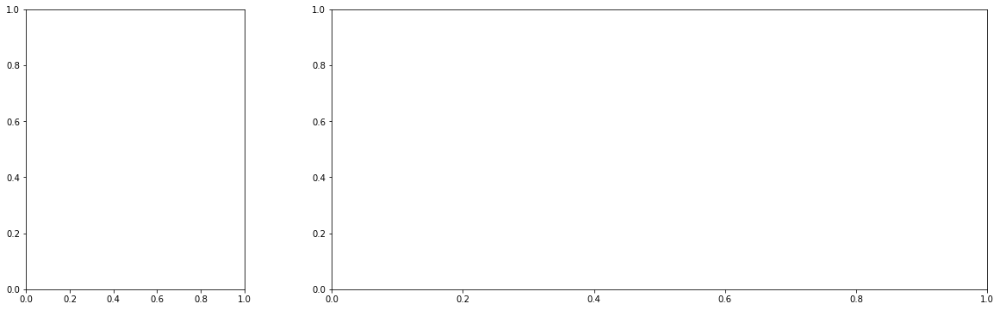

In [34]:

fig, axs = plt.subplots(1, 2, figsize=(20,6), gridspec_kw={'width_ratios': [1, 3]})

axs[0].imshow(C_chain)

for i in range(10):
    i += 1
    chain = im111_sp[im111_sp['image_chain']==float(i)]
    M_chain = M[:, chain.index]
    C_chain = np.corrcoef(np.transpose(M_chain))
    axs[1].plot(C_chain[0, :], alpha=0.3, label=f'{i} chain im111')
    #print(np.mean(C_chain[0, :]))


axs[1].set_ylabel('Representational Similarity')
axs[1].set_xlabel('Stimulus Presentations')
axs[1].legend()

